In [13]:
# get data
import torch
import torchvision

from datasets.CustomPoints import CustomPoints
from temp.siamunet_diff import SiamUnet_diff
from transforms.AppendFeatures import AppendFeatures
from transforms.AppendFeaturesTest import AppendFeaturesTest
import matplotlib.pyplot as plt

In [14]:


path = '/Users/zygimantas/Downloads/samples224-24.291850173766075_54.49574260455312'
model_checkpoint = '/Users/zygimantas/Documents/sources/geo/train-additional/models/ckpts/epoch=1-step=98000-v3.ckpt'
feature_model_path = '/Users/zygimantas/Documents/sources/geo/train-additional/Prithvi_100M.pt'
feature_model_checkpoint_path = '/Users/zygimantas/Documents/sources/geo/train-additional/Prithvi_100M_config.yaml'
names_file = path + '/samples.txt'

In [15]:

transform = AppendFeaturesTest(
    feature_model_path=feature_model_path, feature_model_checkpoint_path=feature_model_checkpoint_path)
dataset = CustomPoints(path=path, names_file=names_file)
dataloader = torch.utils.data.DataLoader(
    dataset, batch_size=1, shuffle=False, num_workers=0)
# get model
model = SiamUnet_diff(13, 2, 50, apply_softmax=False)

if model_checkpoint is not None:
    if torch.cuda.is_available():
        checkpoint = torch.load(model_checkpoint)
    else:
        checkpoint = torch.load(
            model_checkpoint, map_location=torch.device('cpu'))

In [16]:

def masked_mean(tensor, mask, dim=None):
    """Finding the mean along dim"""
    masked = torch.mul(
        tensor, mask)  # Apply the mask using an element-wise multiply
    return masked.sum(dim=dim) / mask.sum(dim=dim)  # Find the average!


confidence_pred = []
preds = []
# run model
with torch.no_grad():
    for x1, x2 in dataloader:
        x1, x2, feat1, feat2 = transform((x1, x2))
        y_out = model(x1, x2, feat1, feat2)
        y_pred = torch.sigmoid(y_out)
        preds.append((x1, x2, y_pred))


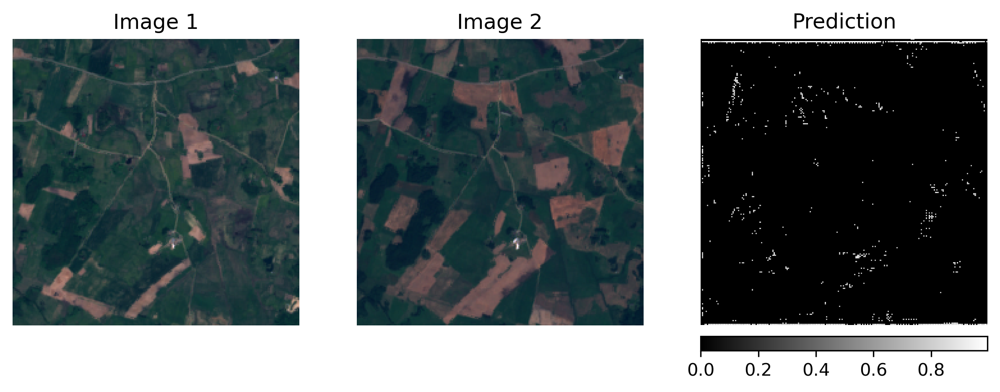

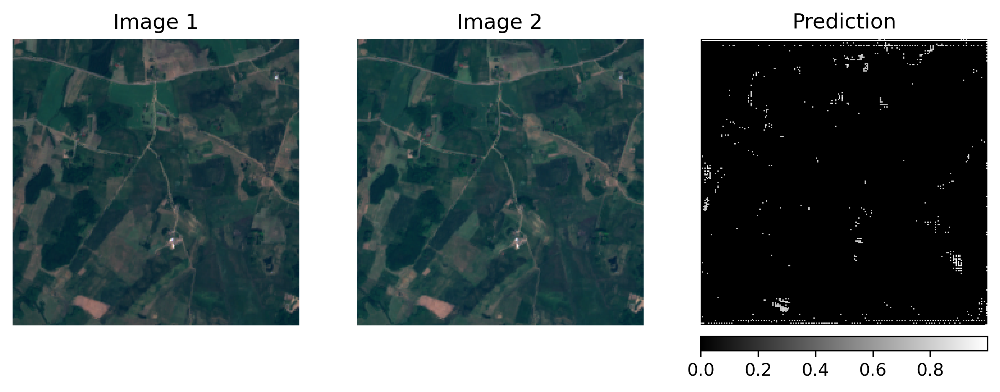

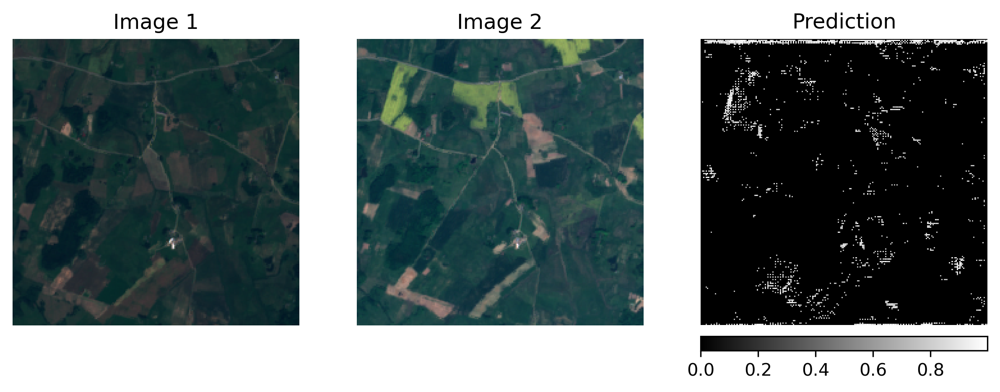

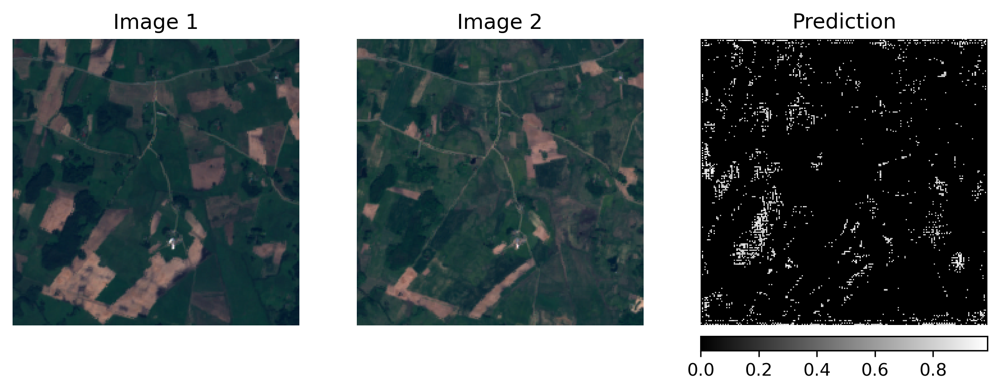

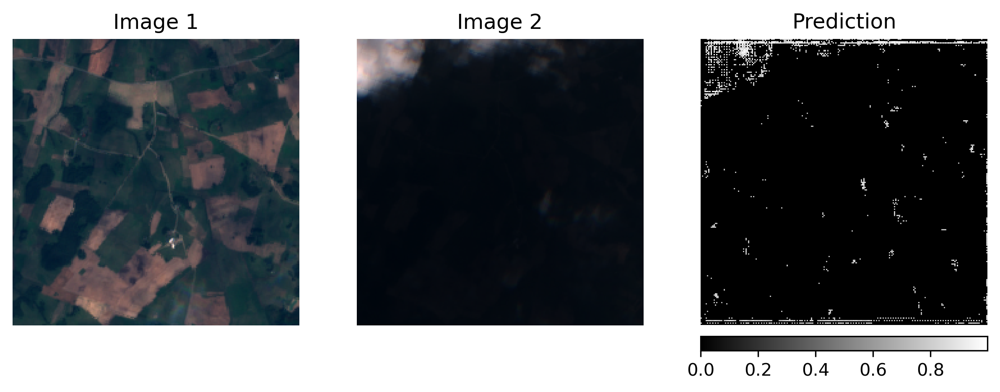

...

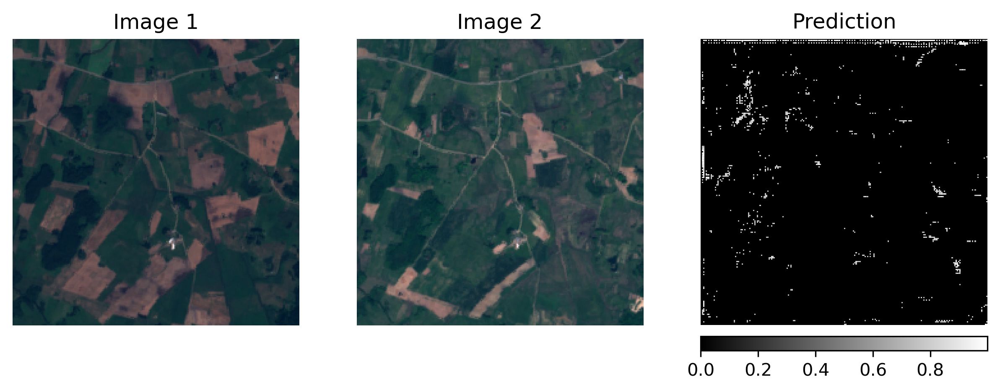

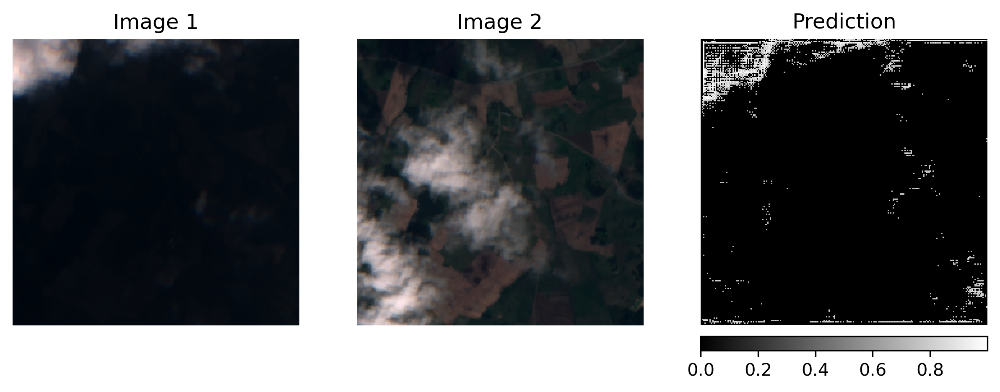

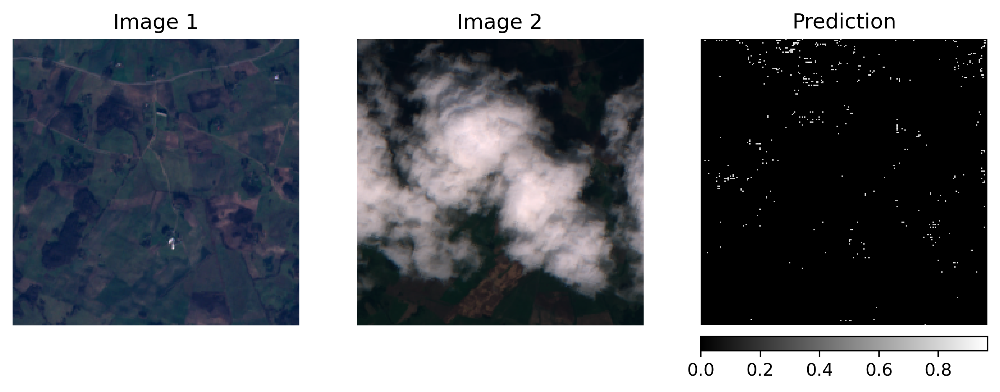

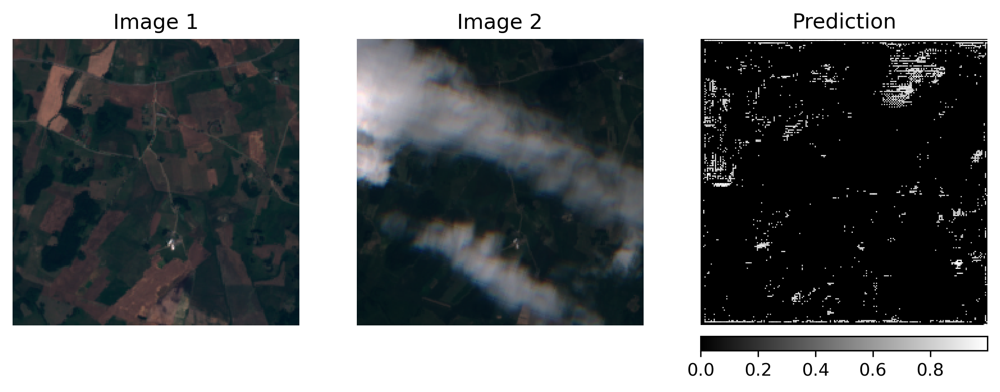

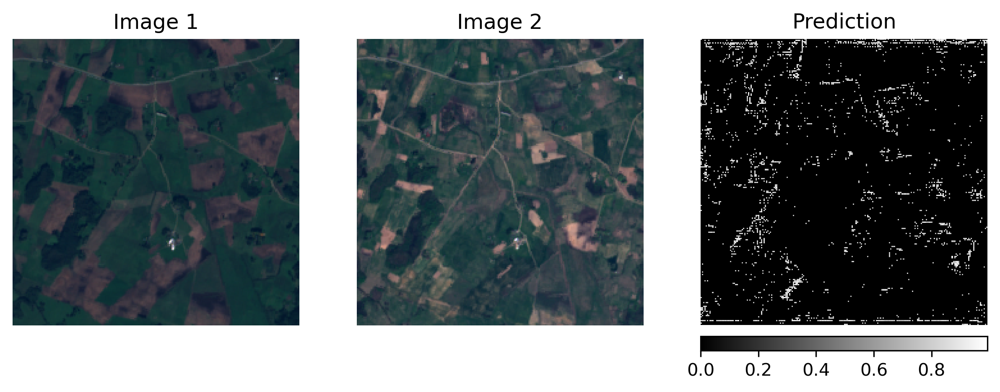

In [17]:
import matplotlib as mpl
import numpy as np
mpl.rcParams['figure.dpi'] = 300

def normalize(x):
    x = x - x.min()
    x = x / (x.max() - x.min())
    return x


threshold = 0.7
confidence_pred = []
for x1, x2, y_pred in preds:
    pred_mask = y_pred > threshold
    confidence = masked_mean(y_pred, pred_mask)
    confidence_pred.append((confidence, x1, x2, y_pred))
# sort confidence
confidence_pred.sort(key=lambda x: x[0], reverse=True)
# get top 20
top_20 = confidence_pred[:40]

for i, (confidence, x1, x2, y_pred) in enumerate(top_20):
    # show image 1 row 3 columns
    plt.figure(figsize=(10, 10))
    plt.subplot(2, 3, 1)
    x1 = x1.squeeze()[[3, 2, 1], :, :].numpy().transpose(1, 2, 0)
    x1 = normalize(x1)
    plt.imshow(x1)
    plt.title('Image 1')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    x2 = x2.squeeze()[[3, 2, 1], :, :].numpy().transpose(1, 2, 0)
    x2 = normalize(x2)
    plt.imshow(x2)
    plt.title('Image 2')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    y_pred = y_pred.squeeze().numpy()[1, :, :]
    # 1 - change, 0 - no change
    y_pred = y_pred * (y_pred > threshold)
    plt.imshow(y_pred, cmap='gray')
    plt.colorbar(location='bottom', orientation='horizontal', shrink=1, pad=0.025)
    plt.title('Prediction')
    plt.axis('off')
    plt.show()

In [21]:
from ipywidgets import interact
import ipywidgets as widgets


def show_plot(i, threshold):
    confidence, x1, x2, y_pred = top_20[i]
    # show image 1 row 3 columns
    plt.figure(figsize=(10, 10))
    plt.subplot(2, 3, 1)
    x1 = x1.squeeze()[[3, 2, 1], :, :].numpy().transpose(1, 2, 0)
    x1 = normalize(x1)
    plt.imshow(x1)
    plt.title('Image 1')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    x2 = x2.squeeze()[[3, 2, 1], :, :].numpy().transpose(1, 2, 0)
    x2 = normalize(x2)
    plt.imshow(x2)
    plt.title('Image 2')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    y_pred = y_pred.squeeze().numpy()[1, :, :]
    # 1 - change, 0 - no change
    y_pred = y_pred * (y_pred > threshold)
    plt.imshow(y_pred, cmap='gray')
    plt.colorbar(location='bottom', orientation='horizontal', shrink=1, pad=0.025)
    plt.title('Prediction')
    plt.axis('off')
    plt.show()


interact(show_plot, i=widgets.BoundedIntText(
    value=7,
    min=0,
    max=len(top_20)-1,
    step=1,
    description='i',
    disabled=False
), threshold=(0.0, 1.0, 0.001))

interactive(children=(BoundedIntText(value=7, description='i', max=39), FloatSlider(value=0.5, description='th…

<function __main__.show_plot(i, threshold)>